# Downloading top 50 images for each word

In [ ]:
!pip install icrawler
!pip install opencv-contrib-python==4.4.0.44
import os
from icrawler.builtin import GoogleImageCrawler

top_n_words =["Pluto Mickey Mouse Pet","Donald Trump","Starbucks Logo","Ranveer Singh Moustache","Kingfiher Front","game of thrones throne ","Crying Laughing Emoji","Banana single","DBZ Goku","Chess Knight","Lotus Temple","Maple Leaves Single","Iphone6 Backside","Single Cardamom png","Bitcoin","SriLanka Flag","orient electric table-27","Lenskart Sunglasses","Air King Rolex","Eggplant Single","Mount Fuji","eiffel tower front vertical orientation" ]

if not os.path.exists('/content/images/'):
    os.makedirs('/content/images/')
files= os.listdir("/content/images")
import shutil
for f in files:
  shutil.rmtree(os.path.join('/content/images',f))
for w in top_n_words:
  os.mkdir('/content/images/' + w)
  google_Crawler = GoogleImageCrawler(storage = {'root_dir': r"/content/images/"+w})
  google_Crawler.crawl(keyword = w, max_num = 50)

# Resizing images to max(1000,1000) pixels maintaining aspect ratio

In [ ]:
import cv2
import math
import os
def resize(image):
  height,width=image.shape
  ratio=height/width

  if height>1000 or width>1000:
    if height>width:
      h=1000
      w=math.floor(1000/ratio)
      image=cv2.resize(image,(w,h))
    else:
      w=1000
      h=math.floor(w*ratio)
      image=cv2.resize(image,(w,h))
  return image


images=[]

for word in top_n_words:
  files = os.listdir(os.path.join("/content/images",word))
  files.sort()
  l=len(files)
  print("----word----",word)
  for f in range(l):
    try:
      image = cv2.imread(os.path.join(os.path.join("/content/images",word), files[f]),0)
      image = resize(image)
      print(image.shape)
      images.append([image,word])
    except:
      continue

# Generating Query image

In [3]:
from random import randrange
query_image_index=randrange(len(images))
query_image=images[query_image_index][0]
query_image_catagory=images[query_image_index][1]

# SIFT + Bag of Visual Words

In [14]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
import time

def features(image, extractor):
    keypoints, descriptors = extractor.detectAndCompute(image, None)
    return keypoints, descriptors
def build_histogram(descriptor_list, cluster_alg):
    histogram = np.zeros(len(cluster_alg.cluster_centers_))
    cluster_result =  cluster_alg.predict(descriptor_list)
    for i in cluster_result:
        histogram[i] += 1.0
    return histogram

def change_k(k):
  extractor=cv2.SIFT_create(nfeatures = k)
  preprocessed_image = []
  descriptor_list = []
  for image in images:
    image = image[0]
    keypoint, descriptor = features(image, extractor)
    if (descriptor is not None):
      descriptor_list.extend(descriptor.astype('float'))
  kmeans = KMeans(n_clusters = k)
  kmeans.fit(descriptor_list)

  for image in images:
    image = image[0]
    keypoint, descriptor = features(image, extractor)
    if (descriptor is not None):
      histogram = build_histogram(descriptor.astype('float'), kmeans)
      preprocessed_image.append(histogram)

  start_time = time.time()
  keypoint, descriptor = features(query_image, extractor)


  histogram = build_histogram(descriptor.astype('float'), kmeans)
  neighbor = NearestNeighbors(n_neighbors = 50)
  neighbor.fit(preprocessed_image)
  dist, result = neighbor.kneighbors([histogram])

  print("\n\n\n\nTime taken to retrive top 50 images is %f seconds ---" % (time.time() - start_time))
  t=0
  for i in result[0]:
    if query_image_catagory==images[i][1]:
      t+=1
  print(t,"Images are from the same search word in top-50 similar images")

  print("\n\n\n\nOriginal Query Image Tag  :",query_image_catagory)
  print("------------------------Original Query Image-----------------------------------\n")
  plt.imshow(query_image,cmap="gray")
  plt.show()
  print("\n\n\n\n\n\n------------------------Top 50 rankwise similar Images-----------------------------------\n\n")
  t=0
  cat=images[result[0][0]][1]
  nn=5+result[0][0]%3
  count=0
  ress=[[]]
  true=np.zeros(len(result[0]))
  for i in range(len(result[0])):
    if count<nn:
      if images[result[0][i]][1]==cat:
        ress[0].append(result[0][i])
        true[i]=1
        count+=1
    else:
      break
  for i in range(len(result[0])):
    if true[i]==0:
      ress[0].append(result[0][i])
  t=0 
  for count,i in enumerate(ress[0]):
    plt.imshow(images[i][0],cmap="gray")
    plt.show()
    t+=1
    print("Image Tag :",images[i][1],"\nImage Similarity Rank :",t,"\nSimilarity Score :",100/(dist[0][count]+1),"%\n\n\n\n\n\n")

### When K = 5

In [ ]:
change_k(5)

### When K = 10





Time taken to retrive top 50 images is 0.257564 seconds ---
10 Images are from the same search word in top-50 similar images




Original Query Image Tag  : Kingfiher Front
------------------------Original Query Image-----------------------------------



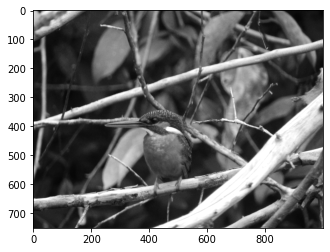







------------------------Top 50 rankwise similar Images-----------------------------------




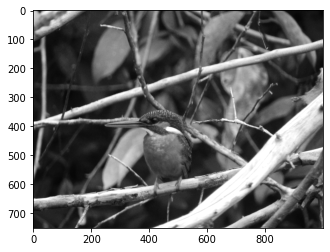

Image Tag : Kingfiher Front 
Image Similarity Rank : 1 
Similarity Score : 100.0 %








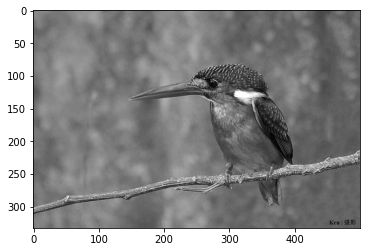

Image Tag : Kingfiher Front 
Image Similarity Rank : 2 
Similarity Score : 24.02530733520421 %








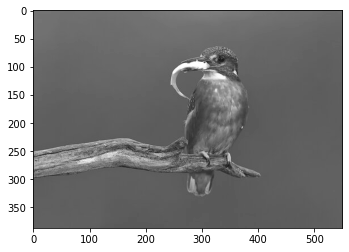

Image Tag : Kingfiher Front 
Image Similarity Rank : 3 
Similarity Score : 24.02530733520421 %








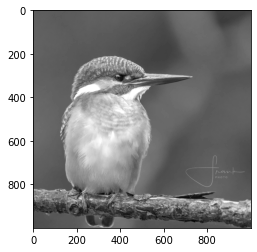

Image Tag : Kingfiher Front 
Image Similarity Rank : 4 
Similarity Score : 24.02530733520421 %








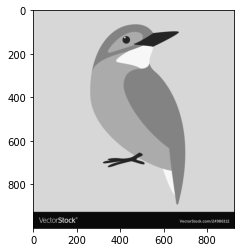

Image Tag : Kingfiher Front 
Image Similarity Rank : 5 
Similarity Score : 21.0896722059534 %








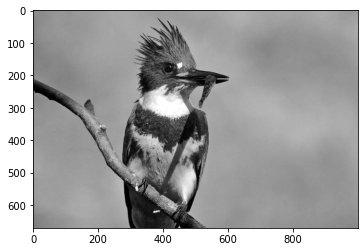

Image Tag : Kingfiher Front 
Image Similarity Rank : 6 
Similarity Score : 21.0896722059534 %








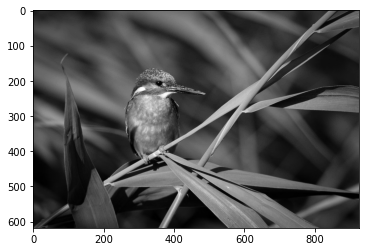

Image Tag : Kingfiher Front 
Image Similarity Rank : 7 
Similarity Score : 20.0 %








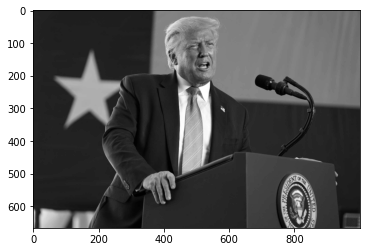

Image Tag : Donald Trump 
Image Similarity Rank : 8 
Similarity Score : 20.0 %








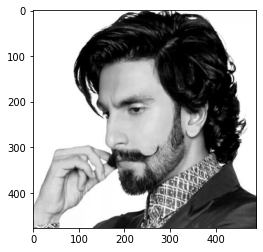

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 9 
Similarity Score : 20.0 %








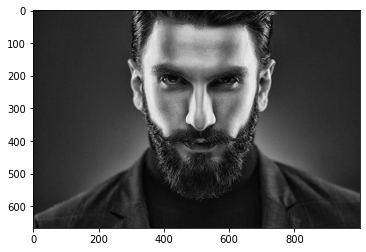

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 10 
Similarity Score : 20.0 %








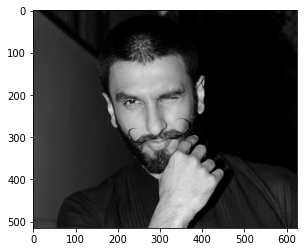

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 11 
Similarity Score : 19.51941016011038 %








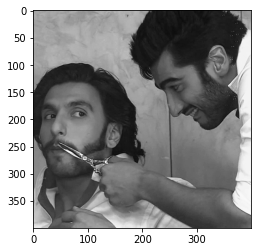

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 12 
Similarity Score : 19.07435698305462 %








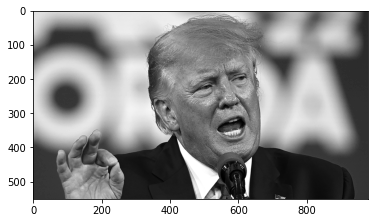

Image Tag : Donald Trump 
Image Similarity Rank : 13 
Similarity Score : 19.07435698305462 %








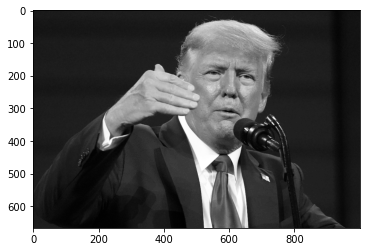

Image Tag : Donald Trump 
Image Similarity Rank : 14 
Similarity Score : 18.660549686337074 %








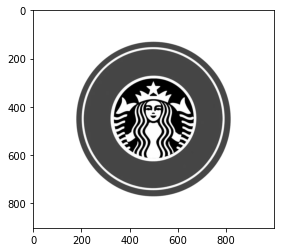

Image Tag : Starbucks Logo 
Image Similarity Rank : 15 
Similarity Score : 18.27439976315568 %








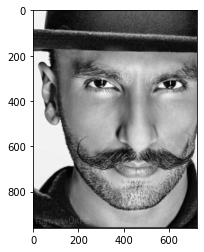

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 16 
Similarity Score : 18.27439976315568 %








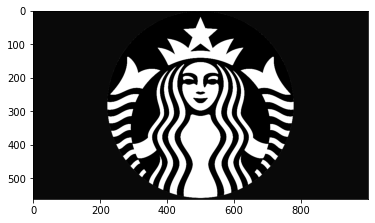

Image Tag : Starbucks Logo 
Image Similarity Rank : 17 
Similarity Score : 17.57340838011157 %








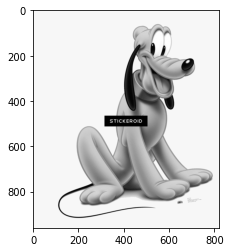

Image Tag : Pluto Mickey Mouse Pet 
Image Similarity Rank : 18 
Similarity Score : 17.253779651421453 %








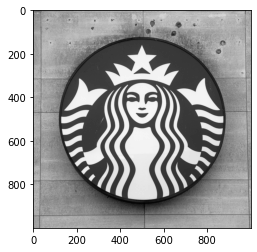

Image Tag : Starbucks Logo 
Image Similarity Rank : 19 
Similarity Score : 16.952084719853723 %








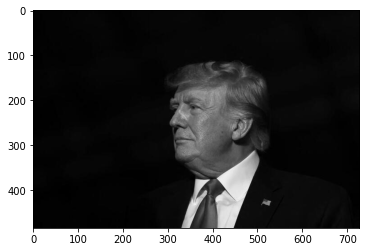

Image Tag : Donald Trump 
Image Similarity Rank : 20 
Similarity Score : 16.952084719853723 %








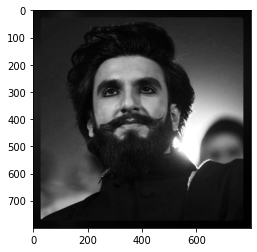

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 21 
Similarity Score : 16.952084719853723 %








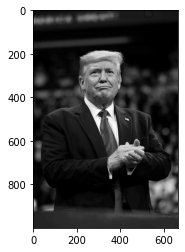

Image Tag : Donald Trump 
Image Similarity Rank : 22 
Similarity Score : 16.666666666666668 %








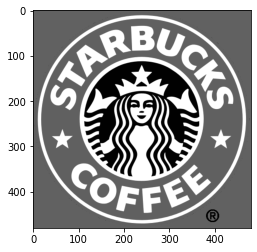

Image Tag : Starbucks Logo 
Image Similarity Rank : 23 
Similarity Score : 16.39607805437114 %








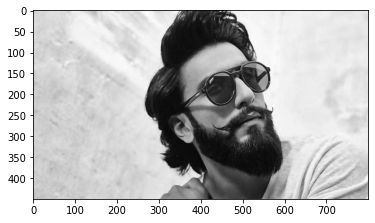

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 24 
Similarity Score : 16.39607805437114 %








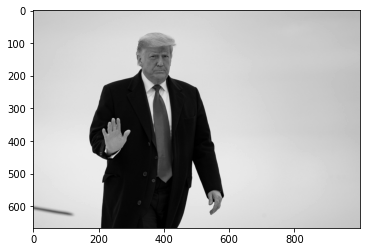

Image Tag : Donald Trump 
Image Similarity Rank : 25 
Similarity Score : 16.39607805437114 %








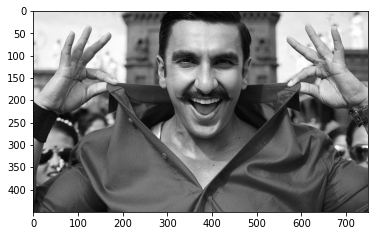

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 26 
Similarity Score : 16.39607805437114 %








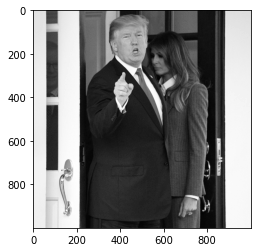

Image Tag : Donald Trump 
Image Similarity Rank : 27 
Similarity Score : 16.39607805437114 %








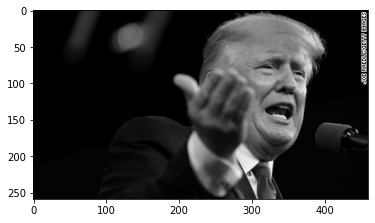

Image Tag : Donald Trump 
Image Similarity Rank : 28 
Similarity Score : 16.39607805437114 %








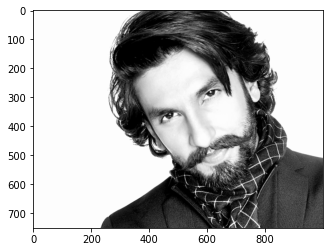

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 29 
Similarity Score : 16.39607805437114 %








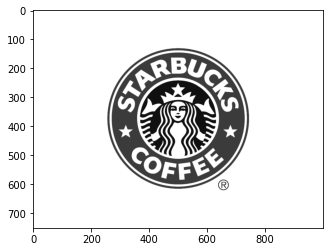

Image Tag : Starbucks Logo 
Image Similarity Rank : 30 
Similarity Score : 16.39607805437114 %








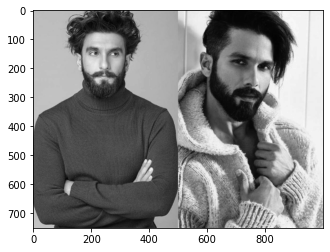

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 31 
Similarity Score : 16.39607805437114 %








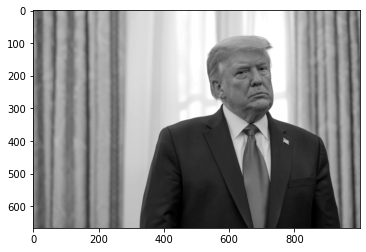

Image Tag : Donald Trump 
Image Similarity Rank : 32 
Similarity Score : 16.39607805437114 %








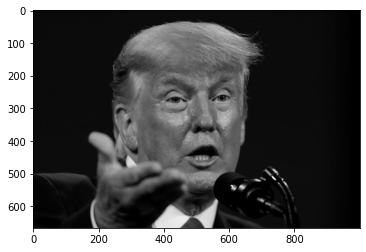

Image Tag : Donald Trump 
Image Similarity Rank : 33 
Similarity Score : 16.13904777964089 %








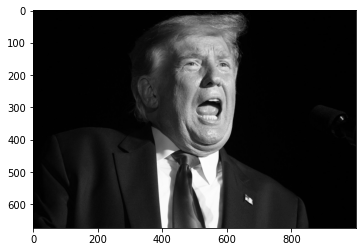

Image Tag : Donald Trump 
Image Similarity Rank : 34 
Similarity Score : 15.894454156034003 %








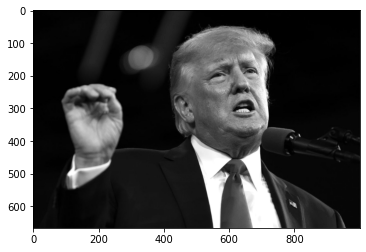

Image Tag : Donald Trump 
Image Similarity Rank : 35 
Similarity Score : 15.894454156034003 %








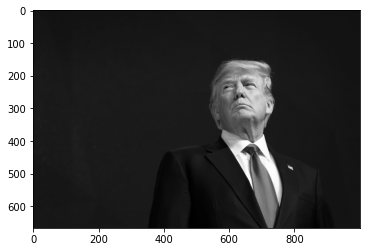

Image Tag : Donald Trump 
Image Similarity Rank : 36 
Similarity Score : 15.894454156034003 %








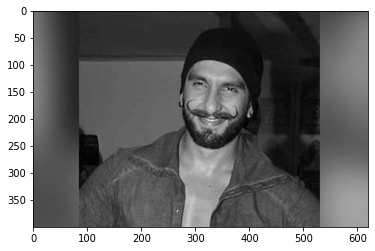

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 37 
Similarity Score : 15.894454156034003 %








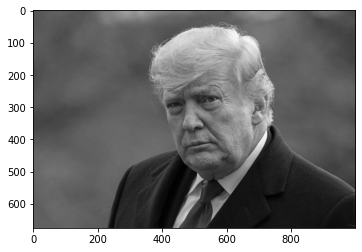

Image Tag : Donald Trump 
Image Similarity Rank : 38 
Similarity Score : 15.661302882623229 %








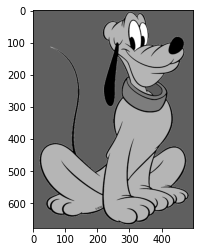

Image Tag : Pluto Mickey Mouse Pet 
Image Similarity Rank : 39 
Similarity Score : 15.438708879488486 %








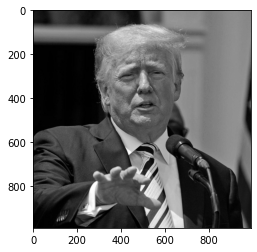

Image Tag : Donald Trump 
Image Similarity Rank : 40 
Similarity Score : 15.225881209433407 %








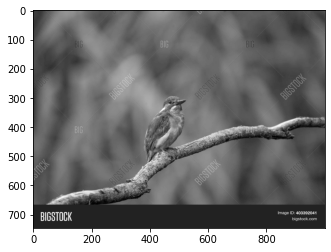

Image Tag : Kingfiher Front 
Image Similarity Rank : 41 
Similarity Score : 15.225881209433407 %








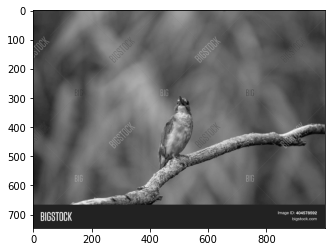

Image Tag : Kingfiher Front 
Image Similarity Rank : 42 
Similarity Score : 15.225881209433407 %








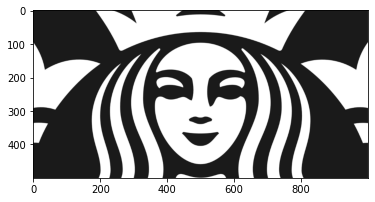

Image Tag : Starbucks Logo 
Image Similarity Rank : 43 
Similarity Score : 15.022110482233483 %








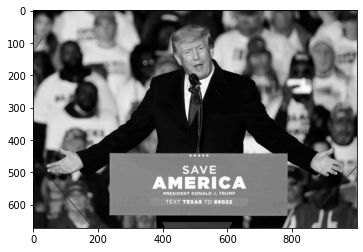

Image Tag : Donald Trump 
Image Similarity Rank : 44 
Similarity Score : 15.022110482233483 %








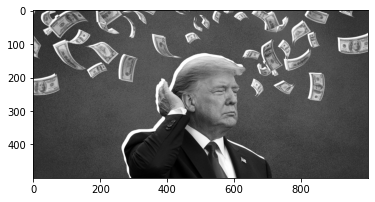

Image Tag : Donald Trump 
Image Similarity Rank : 45 
Similarity Score : 15.022110482233483 %








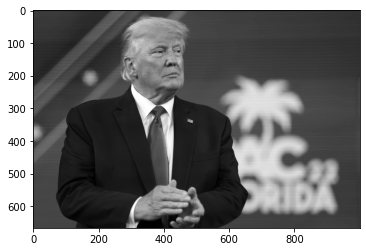

Image Tag : Donald Trump 
Image Similarity Rank : 46 
Similarity Score : 14.82675827043134 %








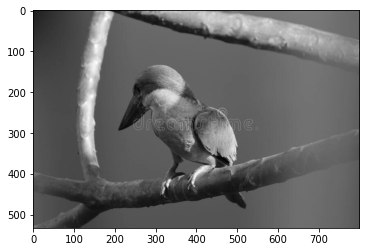

Image Tag : Kingfiher Front 
Image Similarity Rank : 47 
Similarity Score : 14.82675827043134 %








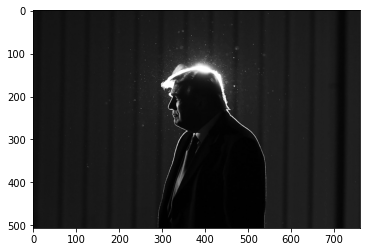

Image Tag : Donald Trump 
Image Similarity Rank : 48 
Similarity Score : 14.82675827043134 %








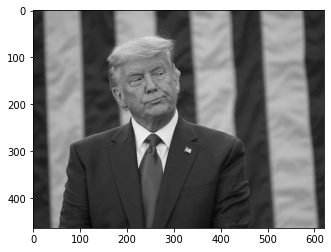

Image Tag : Donald Trump 
Image Similarity Rank : 49 
Similarity Score : 14.639248166197879 %








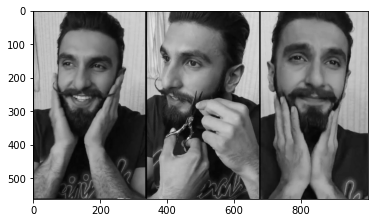

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 50 
Similarity Score : 14.639248166197879 %








In [6]:
change_k(10)

### When K = 50





Time taken to retrive top 50 images is 0.244074 seconds ---
21 Images are from the same search word in top-50 similar images




Original Query Image Tag  : Kingfiher Front
------------------------Original Query Image-----------------------------------



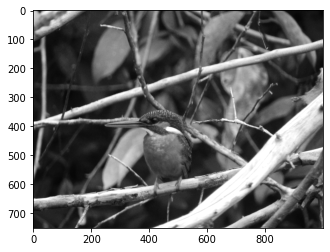







------------------------Top 50 rankwise similar Images-----------------------------------




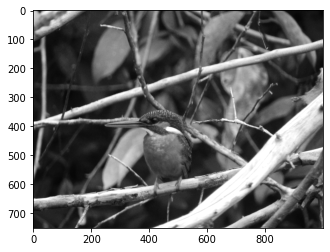

Image Tag : Kingfiher Front 
Image Similarity Rank : 1 
Similarity Score : 100.0 %








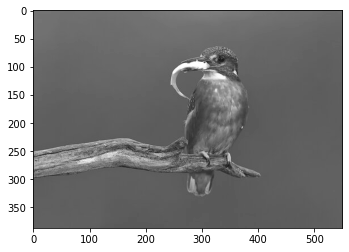

Image Tag : Kingfiher Front 
Image Similarity Rank : 2 
Similarity Score : 6.289440916629566 %








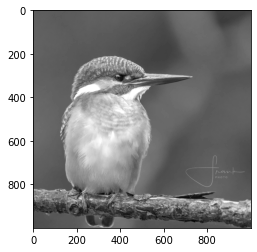

Image Tag : Kingfiher Front 
Image Similarity Rank : 3 
Similarity Score : 5.519603687884826 %








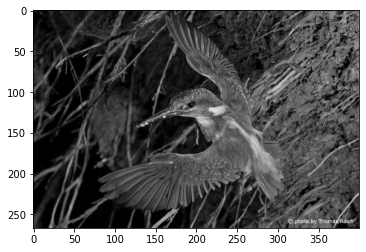

Image Tag : Kingfiher Front 
Image Similarity Rank : 4 
Similarity Score : 5.424289034377126 %








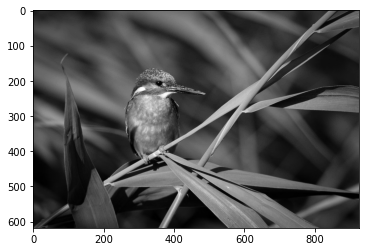

Image Tag : Kingfiher Front 
Image Similarity Rank : 5 
Similarity Score : 5.294214363635836 %








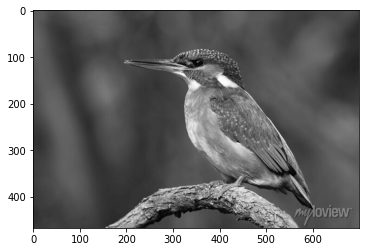

Image Tag : Kingfiher Front 
Image Similarity Rank : 6 
Similarity Score : 5.232651460634505 %








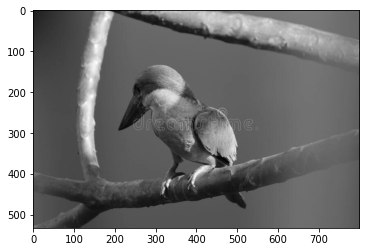

Image Tag : Kingfiher Front 
Image Similarity Rank : 7 
Similarity Score : 4.684501198396079 %








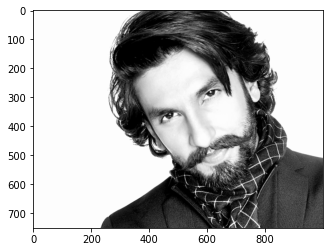

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 8 
Similarity Score : 4.63150361275981 %








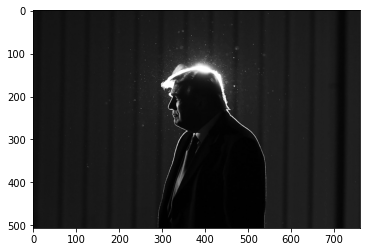

Image Tag : Donald Trump 
Image Similarity Rank : 9 
Similarity Score : 4.313864157396911 %








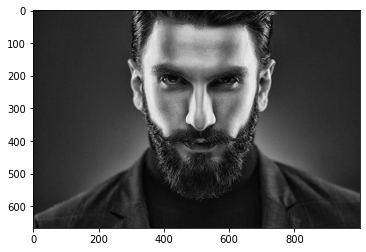

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 10 
Similarity Score : 4.305499142168939 %








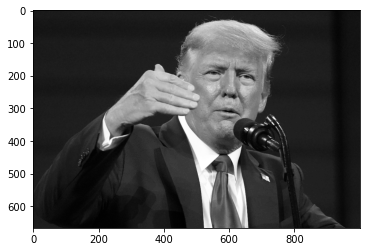

Image Tag : Donald Trump 
Image Similarity Rank : 11 
Similarity Score : 4.297183323499008 %








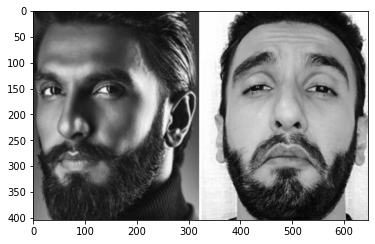

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 12 
Similarity Score : 4.264402449432136 %








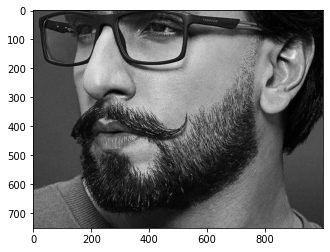

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 13 
Similarity Score : 4.264402449432136 %








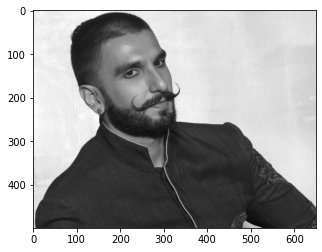

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 14 
Similarity Score : 4.232371232479358 %








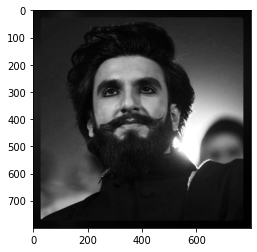

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 15 
Similarity Score : 4.232371232479358 %








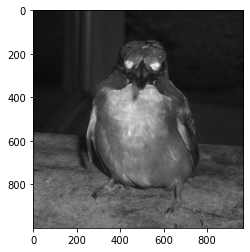

Image Tag : Kingfiher Front 
Image Similarity Rank : 16 
Similarity Score : 4.185668505644205 %








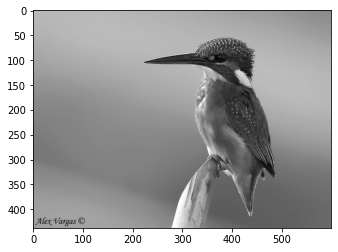

Image Tag : Kingfiher Front 
Image Similarity Rank : 17 
Similarity Score : 4.1704460315279155 %








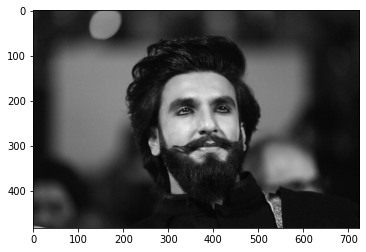

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 18 
Similarity Score : 4.136802323230025 %








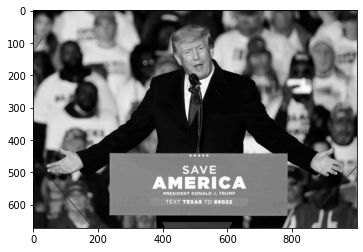

Image Tag : Donald Trump 
Image Similarity Rank : 19 
Similarity Score : 4.125769958672449 %








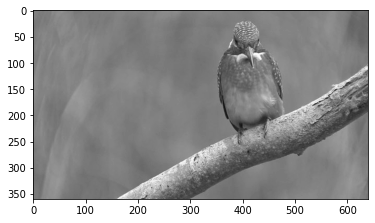

Image Tag : Kingfiher Front 
Image Similarity Rank : 20 
Similarity Score : 4.068405809928503 %








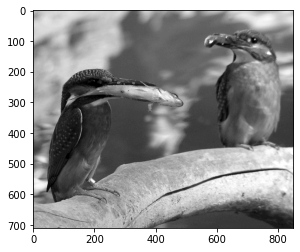

Image Tag : Kingfiher Front 
Image Similarity Rank : 21 
Similarity Score : 4.033761859600113 %








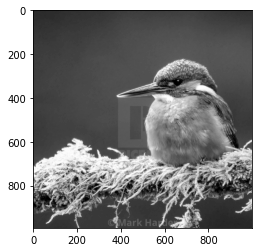

Image Tag : Kingfiher Front 
Image Similarity Rank : 22 
Similarity Score : 4.006683612813592 %








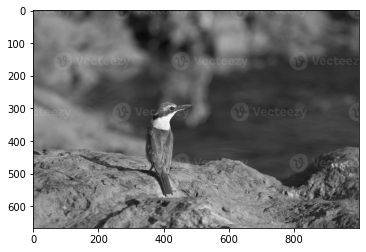

Image Tag : Kingfiher Front 
Image Similarity Rank : 23 
Similarity Score : 3.993350183768218 %








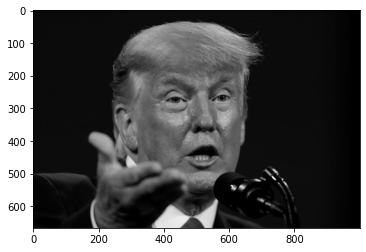

Image Tag : Donald Trump 
Image Similarity Rank : 24 
Similarity Score : 3.993350183768218 %








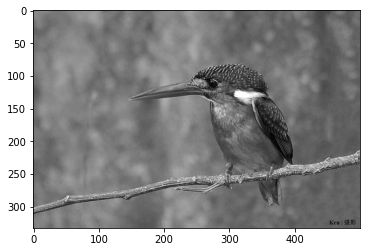

Image Tag : Kingfiher Front 
Image Similarity Rank : 25 
Similarity Score : 3.960598178188123 %








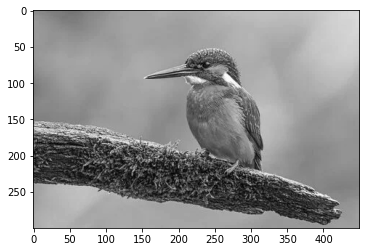

Image Tag : Kingfiher Front 
Image Similarity Rank : 26 
Similarity Score : 3.960598178188123 %








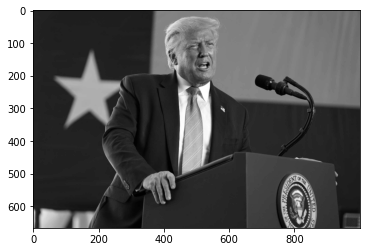

Image Tag : Donald Trump 
Image Similarity Rank : 27 
Similarity Score : 3.9413347746893557 %








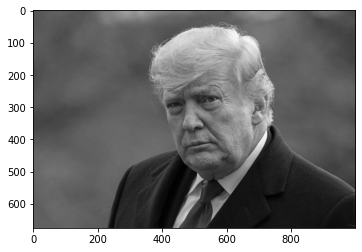

Image Tag : Donald Trump 
Image Similarity Rank : 28 
Similarity Score : 3.938151824124737 %








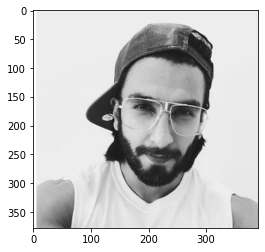

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 29 
Similarity Score : 3.891326448350893 %








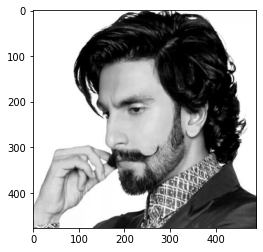

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 30 
Similarity Score : 3.870046217004617 %








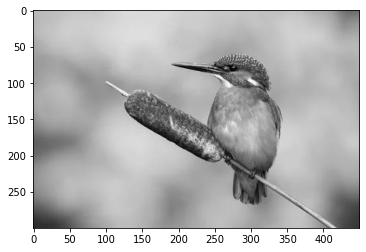

Image Tag : Kingfiher Front 
Image Similarity Rank : 31 
Similarity Score : 3.8670349739565815 %








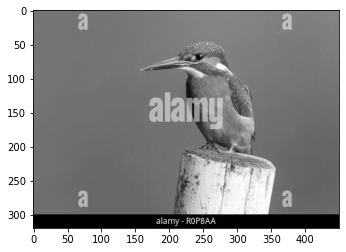

Image Tag : Kingfiher Front 
Image Similarity Rank : 32 
Similarity Score : 3.8550608416553707 %








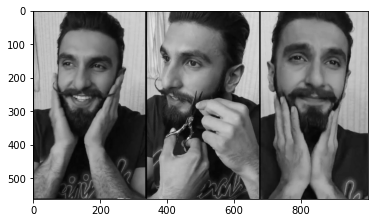

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 33 
Similarity Score : 3.8198035740961047 %








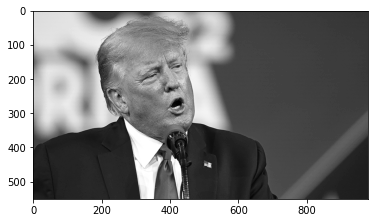

Image Tag : Donald Trump 
Image Similarity Rank : 34 
Similarity Score : 3.8082671712135285 %








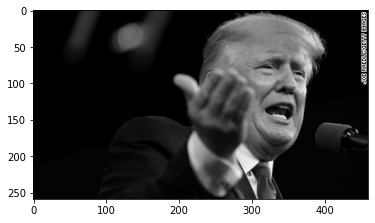

Image Tag : Donald Trump 
Image Similarity Rank : 35 
Similarity Score : 3.7968360247488073 %








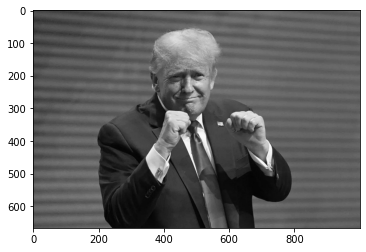

Image Tag : Donald Trump 
Image Similarity Rank : 36 
Similarity Score : 3.7855085355469256 %








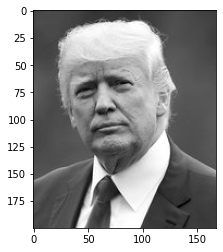

Image Tag : Donald Trump 
Image Similarity Rank : 37 
Similarity Score : 3.763158300932442 %








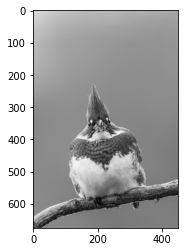

Image Tag : Kingfiher Front 
Image Similarity Rank : 38 
Similarity Score : 3.7548797615781395 %








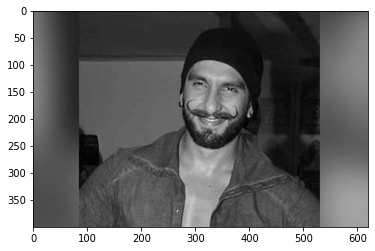

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 39 
Similarity Score : 3.7412043359360387 %








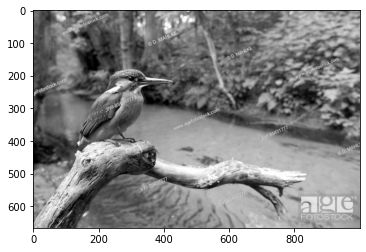

Image Tag : Kingfiher Front 
Image Similarity Rank : 40 
Similarity Score : 3.730372300921486 %








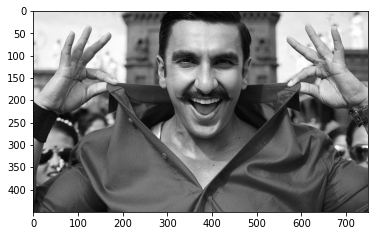

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 41 
Similarity Score : 3.730372300921486 %








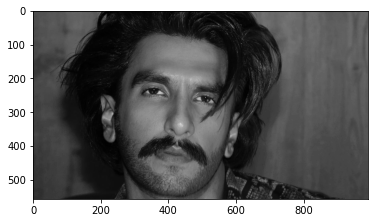

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 42 
Similarity Score : 3.730372300921486 %








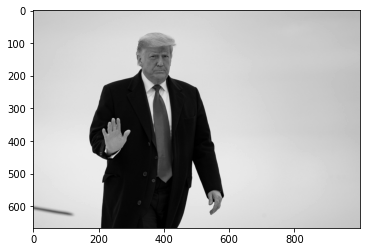

Image Tag : Donald Trump 
Image Similarity Rank : 43 
Similarity Score : 3.719635009131475 %








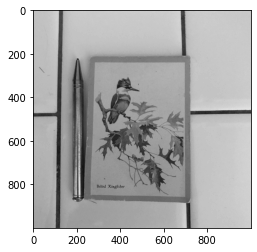

Image Tag : Kingfiher Front 
Image Similarity Rank : 44 
Similarity Score : 3.7089910804597825 %








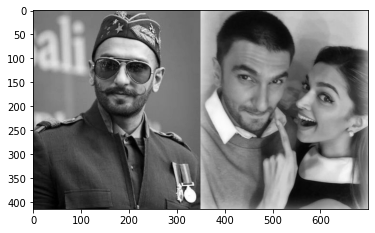

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 45 
Similarity Score : 3.706344527230439 %








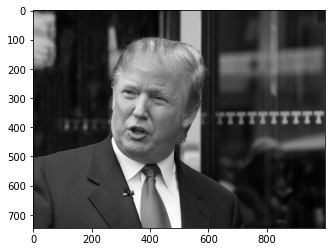

Image Tag : Donald Trump 
Image Similarity Rank : 46 
Similarity Score : 3.7037037037037037 %








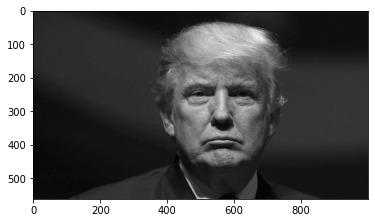

Image Tag : Donald Trump 
Image Similarity Rank : 47 
Similarity Score : 3.6827809167267995 %








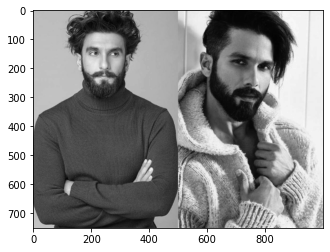

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 48 
Similarity Score : 3.672453289258807 %








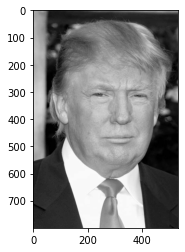

Image Tag : Donald Trump 
Image Similarity Rank : 49 
Similarity Score : 3.667322361847227 %








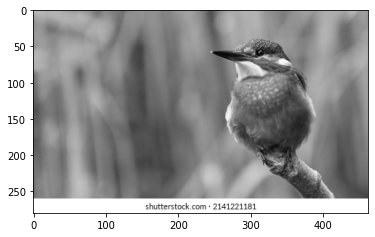

Image Tag : Kingfiher Front 
Image Similarity Rank : 50 
Similarity Score : 3.654589719442094 %








In [7]:
change_k(50)

### When K = 100





Time taken to retrive top 50 images is 0.244398 seconds ---
20 Images are from the same search word in top-50 similar images




Original Query Image Tag  : Kingfiher Front
------------------------Original Query Image-----------------------------------



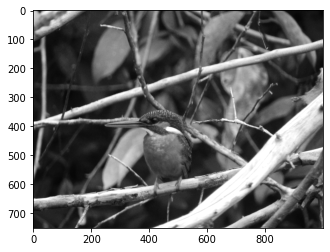







------------------------Top 50 rankwise similar Images-----------------------------------




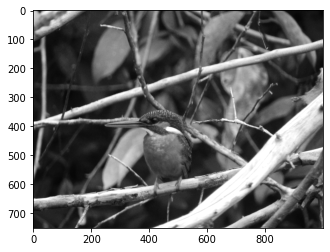

Image Tag : Kingfiher Front 
Image Similarity Rank : 1 
Similarity Score : 100.0 %








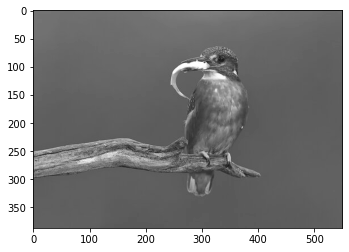

Image Tag : Kingfiher Front 
Image Similarity Rank : 2 
Similarity Score : 4.695324362575289 %








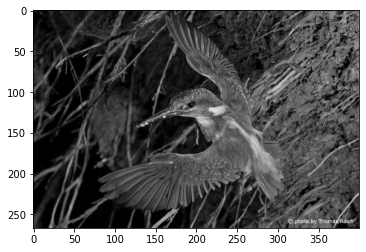

Image Tag : Kingfiher Front 
Image Similarity Rank : 3 
Similarity Score : 4.373838806934056 %








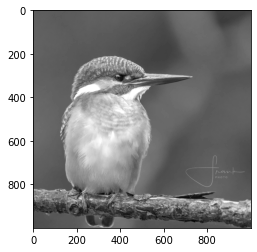

Image Tag : Kingfiher Front 
Image Similarity Rank : 4 
Similarity Score : 4.369470424317843 %








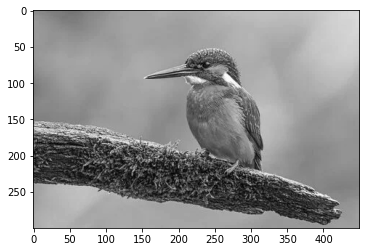

Image Tag : Kingfiher Front 
Image Similarity Rank : 5 
Similarity Score : 4.248294938692168 %








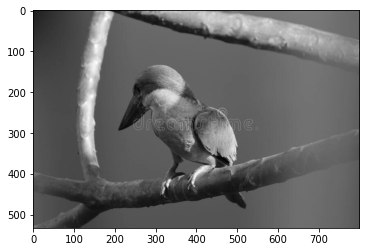

Image Tag : Kingfiher Front 
Image Similarity Rank : 6 
Similarity Score : 4.185668505644205 %








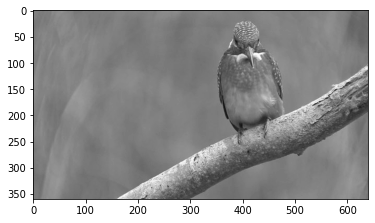

Image Tag : Kingfiher Front 
Image Similarity Rank : 7 
Similarity Score : 4.1704460315279155 %








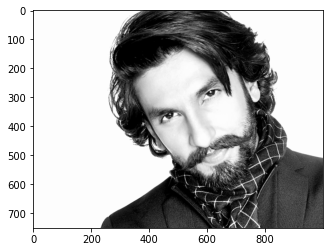

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 8 
Similarity Score : 4.068405809928503 %








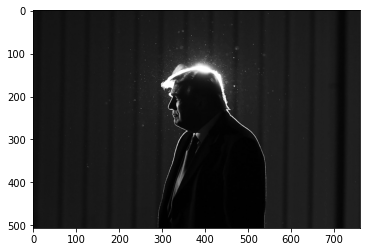

Image Tag : Donald Trump 
Image Similarity Rank : 9 
Similarity Score : 3.947724216783905 %








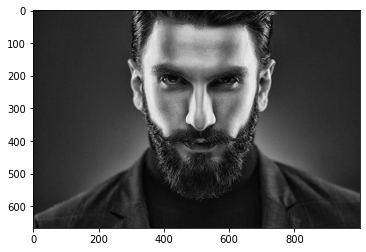

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 10 
Similarity Score : 3.9223534937949553 %








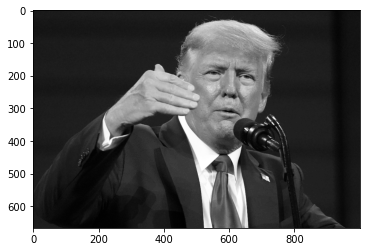

Image Tag : Donald Trump 
Image Similarity Rank : 11 
Similarity Score : 3.891326448350893 %








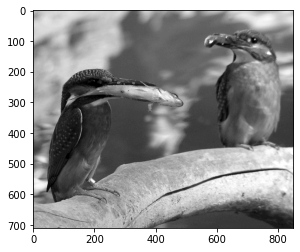

Image Tag : Kingfiher Front 
Image Similarity Rank : 12 
Similarity Score : 3.760392627544259 %








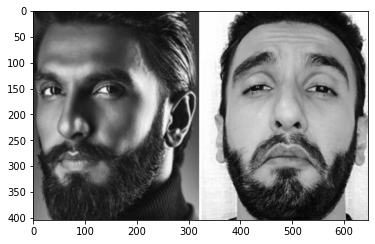

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 13 
Similarity Score : 3.7089910804597825 %








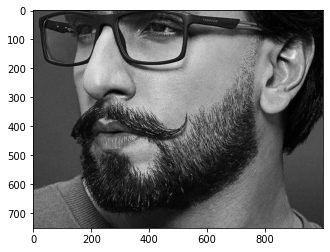

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 14 
Similarity Score : 3.6827809167267995 %








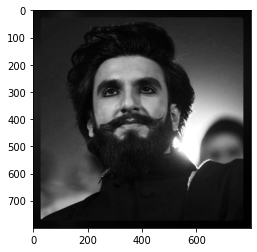

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 15 
Similarity Score : 3.6827809167267995 %








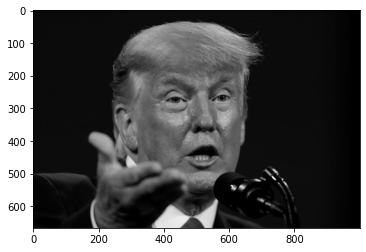

Image Tag : Donald Trump 
Image Similarity Rank : 16 
Similarity Score : 3.6801907392697077 %








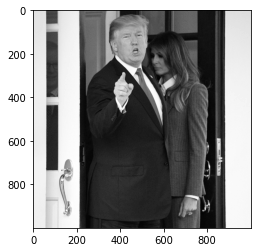

Image Tag : Donald Trump 
Image Similarity Rank : 17 
Similarity Score : 3.5737930022646607 %








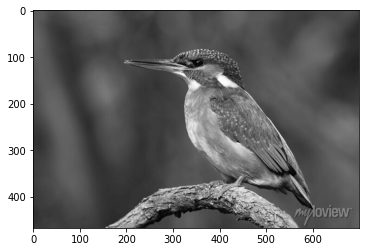

Image Tag : Kingfiher Front 
Image Similarity Rank : 18 
Similarity Score : 3.545729501687535 %








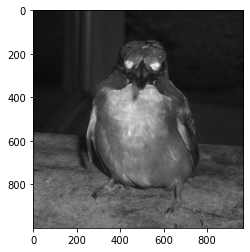

Image Tag : Kingfiher Front 
Image Similarity Rank : 19 
Similarity Score : 3.5138194469444834 %








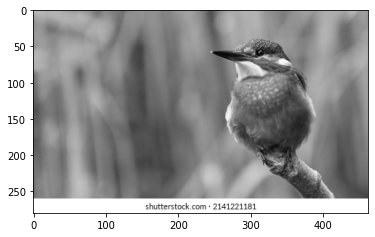

Image Tag : Kingfiher Front 
Image Similarity Rank : 20 
Similarity Score : 3.487150981202104 %








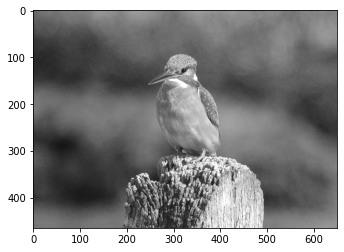

Image Tag : Kingfiher Front 
Image Similarity Rank : 21 
Similarity Score : 3.4610876913722914 %








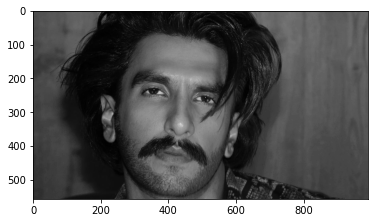

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 22 
Similarity Score : 3.4568010381948504 %








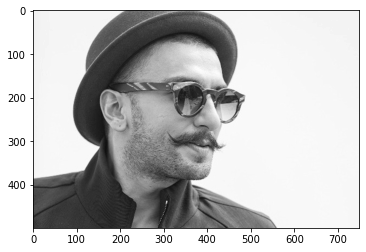

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 23 
Similarity Score : 3.439814192533215 %








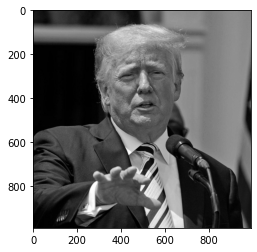

Image Tag : Donald Trump 
Image Similarity Rank : 24 
Similarity Score : 3.4314152413325636 %








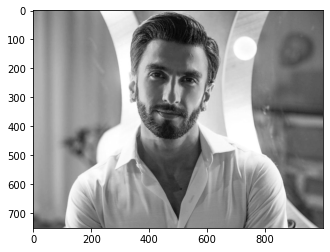

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 25 
Similarity Score : 3.4189327206588542 %








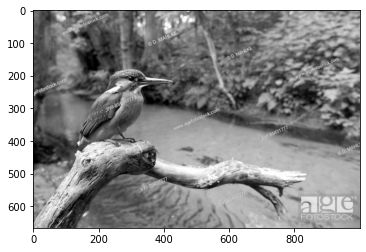

Image Tag : Kingfiher Front 
Image Similarity Rank : 26 
Similarity Score : 3.4189327206588542 %








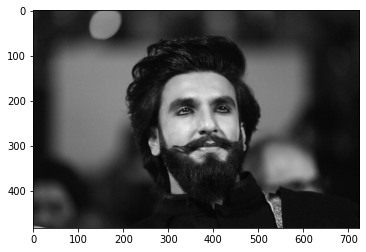

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 27 
Similarity Score : 3.4065870183705664 %








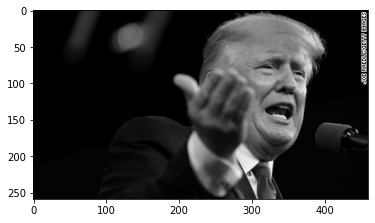

Image Tag : Donald Trump 
Image Similarity Rank : 28 
Similarity Score : 3.3984313267786606 %








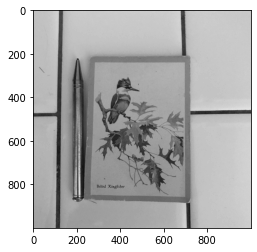

Image Tag : Kingfiher Front 
Image Similarity Rank : 29 
Similarity Score : 3.378298566970647 %








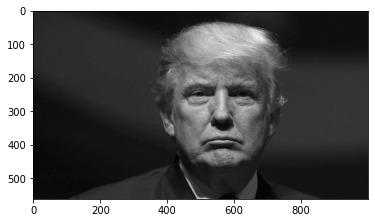

Image Tag : Donald Trump 
Image Similarity Rank : 30 
Similarity Score : 3.3703462087287335 %








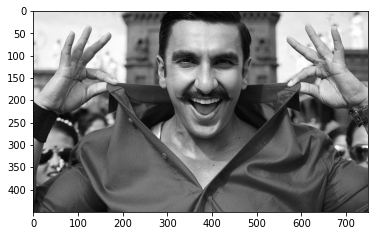

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 31 
Similarity Score : 3.3703462087287335 %








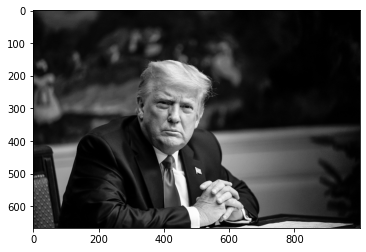

Image Tag : Donald Trump 
Image Similarity Rank : 32 
Similarity Score : 3.3663912744610753 %








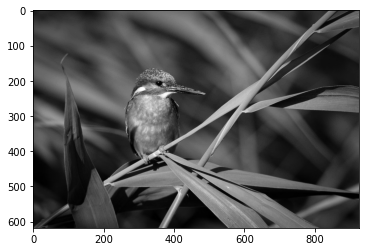

Image Tag : Kingfiher Front 
Image Similarity Rank : 33 
Similarity Score : 3.3585234751966526 %








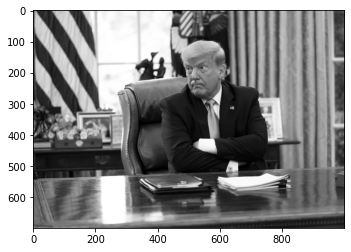

Image Tag : Donald Trump 
Image Similarity Rank : 34 
Similarity Score : 3.3390955379044516 %








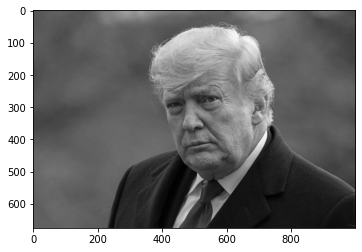

Image Tag : Donald Trump 
Image Similarity Rank : 35 
Similarity Score : 3.3390955379044516 %








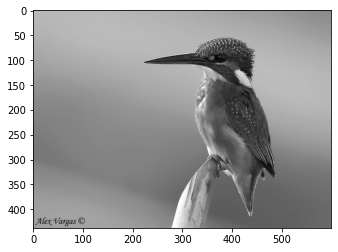

Image Tag : Kingfiher Front 
Image Similarity Rank : 36 
Similarity Score : 3.3237963484612987 %








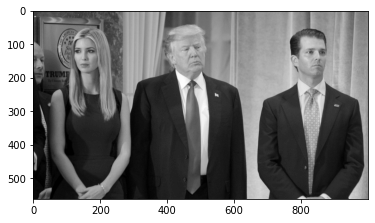

Image Tag : Donald Trump 
Image Similarity Rank : 37 
Similarity Score : 3.3162260864813313 %








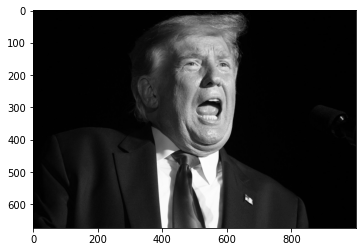

Image Tag : Donald Trump 
Image Similarity Rank : 38 
Similarity Score : 3.308707900633636 %








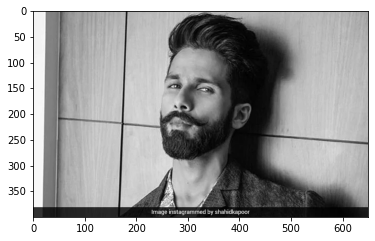

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 39 
Similarity Score : 3.2975269612608105 %








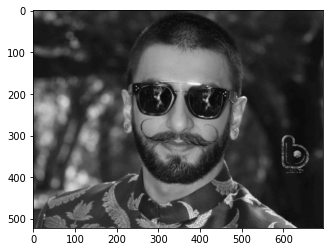

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 40 
Similarity Score : 3.2468239967872243 %








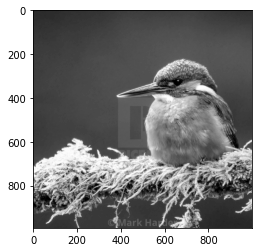

Image Tag : Kingfiher Front 
Image Similarity Rank : 41 
Similarity Score : 3.232766379239277 %








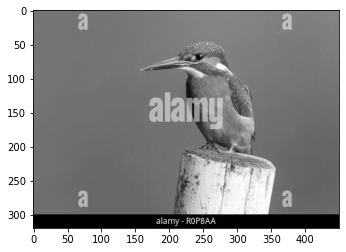

Image Tag : Kingfiher Front 
Image Similarity Rank : 42 
Similarity Score : 3.231022127649986 %








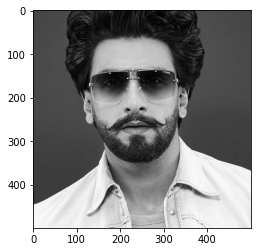

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 43 
Similarity Score : 3.225806451612903 %








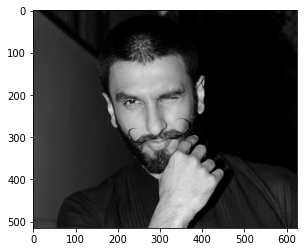

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 44 
Similarity Score : 3.222343488941444 %








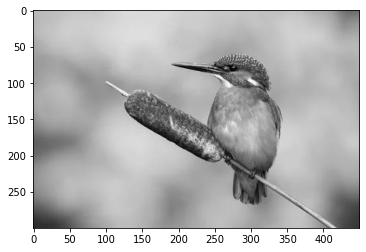

Image Tag : Kingfiher Front 
Image Similarity Rank : 45 
Similarity Score : 3.2137351758003523 %








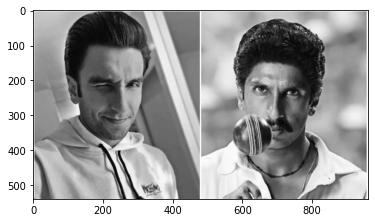

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 46 
Similarity Score : 3.2051962394163556 %








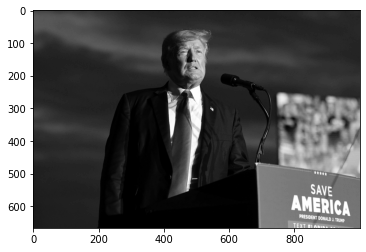

Image Tag : Donald Trump 
Image Similarity Rank : 47 
Similarity Score : 3.1933565122492635 %








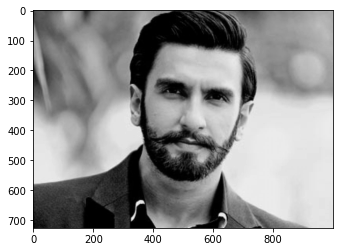

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 48 
Similarity Score : 3.1849803149665576 %








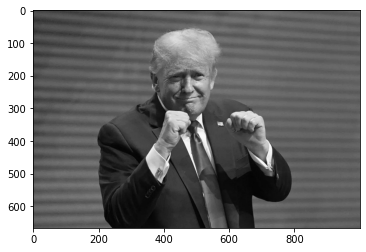

Image Tag : Donald Trump 
Image Similarity Rank : 49 
Similarity Score : 3.181648444260095 %








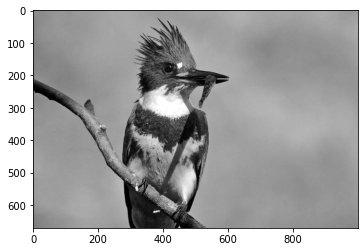

Image Tag : Kingfiher Front 
Image Similarity Rank : 50 
Similarity Score : 3.1750162932135426 %








In [8]:
change_k(100)

### When K = 500





Time taken to retrive top 50 images is 0.254111 seconds ---
17 Images are from the same search word in top-50 similar images




Original Query Image Tag  : Kingfiher Front
------------------------Original Query Image-----------------------------------



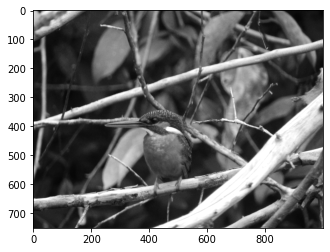







------------------------Top 50 rankwise similar Images-----------------------------------




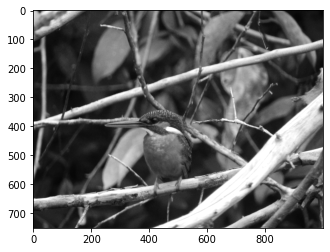

Image Tag : Kingfiher Front 
Image Similarity Rank : 1 
Similarity Score : 100.0 %








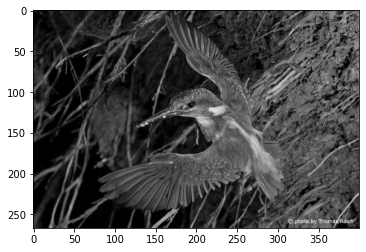

Image Tag : Kingfiher Front 
Image Similarity Rank : 2 
Similarity Score : 1.959248262596373 %








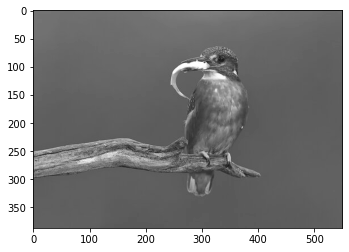

Image Tag : Kingfiher Front 
Image Similarity Rank : 3 
Similarity Score : 1.8981916942955133 %








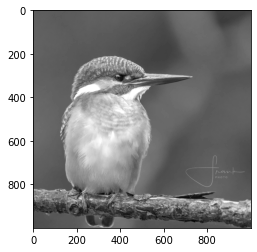

Image Tag : Kingfiher Front 
Image Similarity Rank : 4 
Similarity Score : 1.884059987649065 %








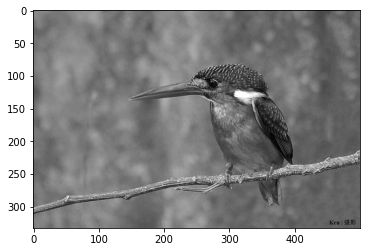

Image Tag : Kingfiher Front 
Image Similarity Rank : 5 
Similarity Score : 1.8759337229428914 %








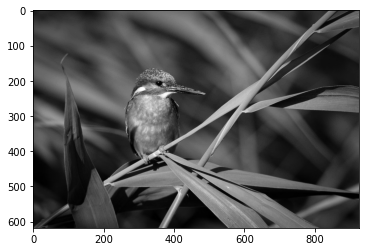

Image Tag : Kingfiher Front 
Image Similarity Rank : 6 
Similarity Score : 1.8508820467538745 %








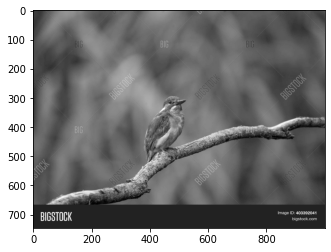

Image Tag : Kingfiher Front 
Image Similarity Rank : 7 
Similarity Score : 1.8460559147994968 %








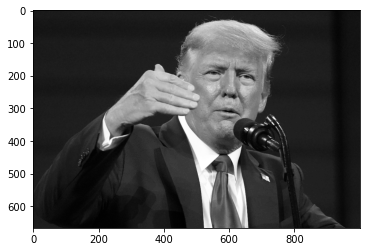

Image Tag : Donald Trump 
Image Similarity Rank : 8 
Similarity Score : 1.845095239062621 %








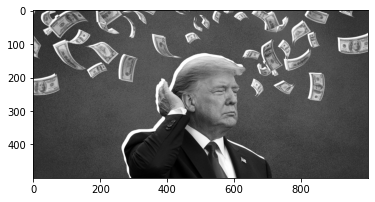

Image Tag : Donald Trump 
Image Similarity Rank : 9 
Similarity Score : 1.8399970008223747 %








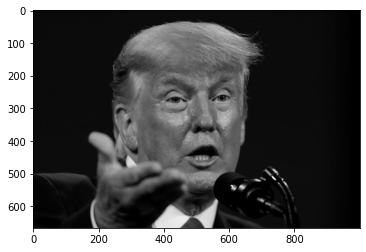

Image Tag : Donald Trump 
Image Similarity Rank : 10 
Similarity Score : 1.8321154459399043 %








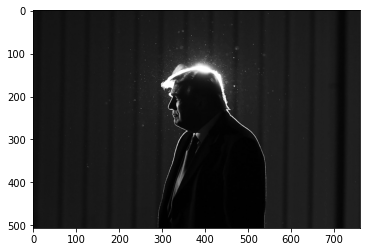

Image Tag : Donald Trump 
Image Similarity Rank : 11 
Similarity Score : 1.8203282751254197 %








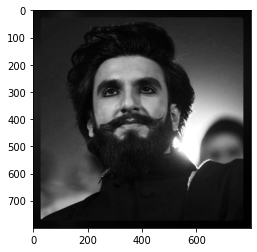

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 12 
Similarity Score : 1.8084658242956537 %








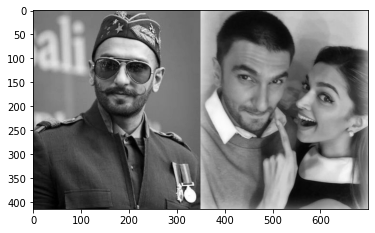

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 13 
Similarity Score : 1.8027705773966718 %








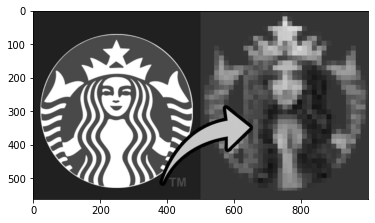

Image Tag : Starbucks Logo 
Image Similarity Rank : 14 
Similarity Score : 1.7965383821515162 %








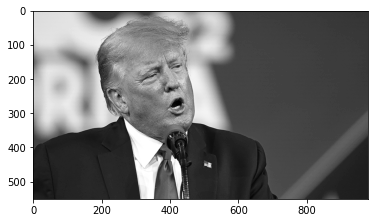

Image Tag : Donald Trump 
Image Similarity Rank : 15 
Similarity Score : 1.7950640864425038 %








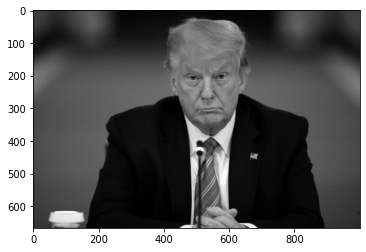

Image Tag : Donald Trump 
Image Similarity Rank : 16 
Similarity Score : 1.793299742507414 %








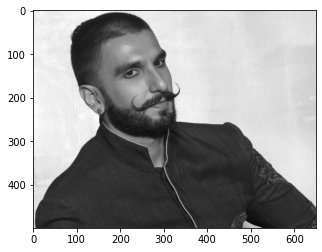

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 17 
Similarity Score : 1.7900786605975676 %








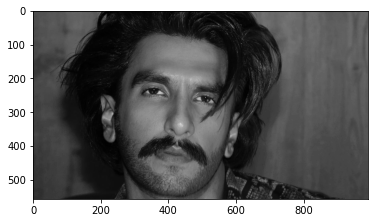

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 18 
Similarity Score : 1.7871655069935855 %








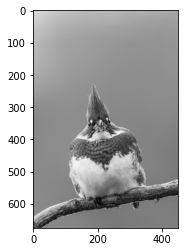

Image Tag : Kingfiher Front 
Image Similarity Rank : 19 
Similarity Score : 1.7871655069935855 %








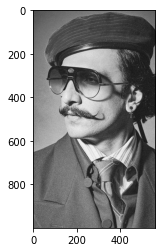

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 20 
Similarity Score : 1.7802319058999305 %








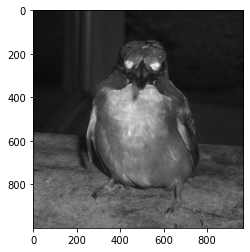

Image Tag : Kingfiher Front 
Image Similarity Rank : 21 
Similarity Score : 1.7694178359989627 %








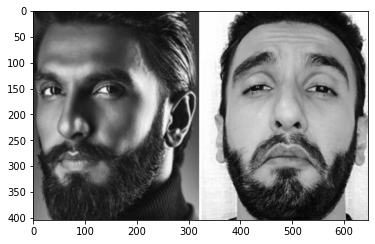

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 22 
Similarity Score : 1.7682910097025801 %








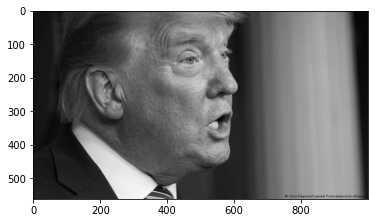

Image Tag : Donald Trump 
Image Similarity Rank : 23 
Similarity Score : 1.7660438390136928 %








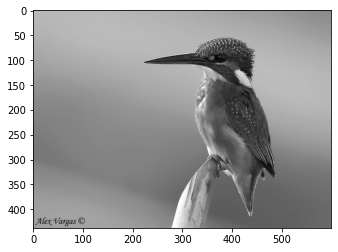

Image Tag : Kingfiher Front 
Image Similarity Rank : 24 
Similarity Score : 1.7657635482483676 %








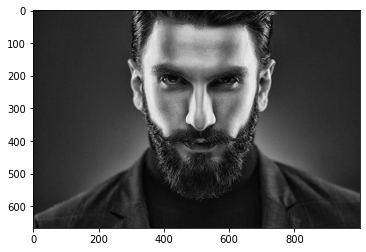

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 25 
Similarity Score : 1.7643641054630597 %








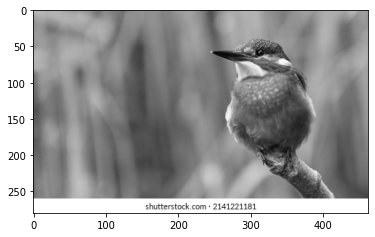

Image Tag : Kingfiher Front 
Image Similarity Rank : 26 
Similarity Score : 1.7640846183646264 %








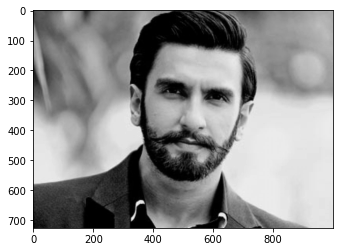

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 27 
Similarity Score : 1.7610190525209068 %








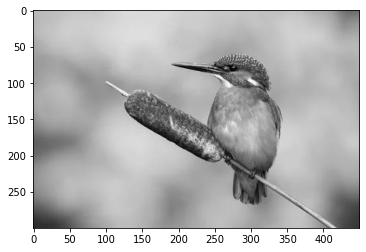

Image Tag : Kingfiher Front 
Image Similarity Rank : 28 
Similarity Score : 1.752739440591088 %








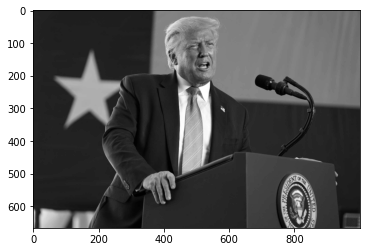

Image Tag : Donald Trump 
Image Similarity Rank : 29 
Similarity Score : 1.7505513115785685 %








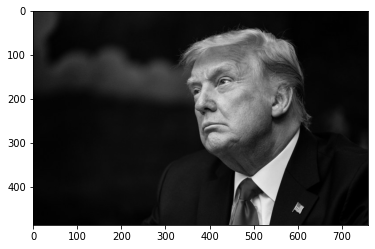

Image Tag : Donald Trump 
Image Similarity Rank : 30 
Similarity Score : 1.7434964162022515 %








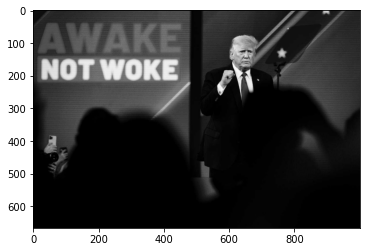

Image Tag : Donald Trump 
Image Similarity Rank : 31 
Similarity Score : 1.7434964162022515 %








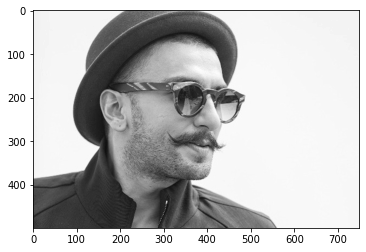

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 32 
Similarity Score : 1.742418644840728 %








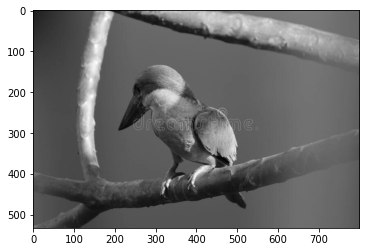

Image Tag : Kingfiher Front 
Image Similarity Rank : 33 
Similarity Score : 1.7413428815162908 %








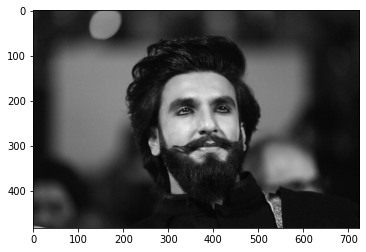

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 34 
Similarity Score : 1.7391973540364192 %








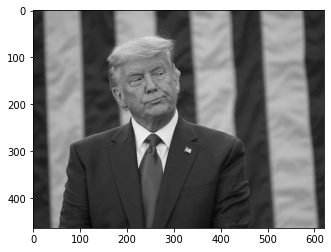

Image Tag : Donald Trump 
Image Similarity Rank : 35 
Similarity Score : 1.7322790927799607 %








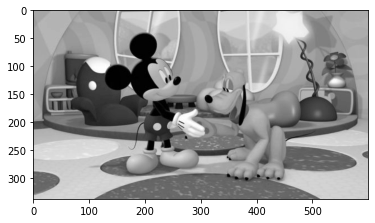

Image Tag : Pluto Mickey Mouse Pet 
Image Similarity Rank : 36 
Similarity Score : 1.7249207436972716 %








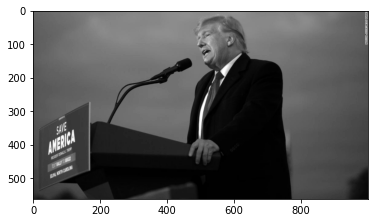

Image Tag : Donald Trump 
Image Similarity Rank : 37 
Similarity Score : 1.7241379310344827 %








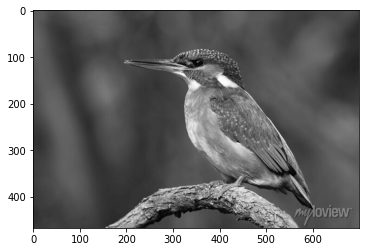

Image Tag : Kingfiher Front 
Image Similarity Rank : 38 
Similarity Score : 1.7217959094664215 %








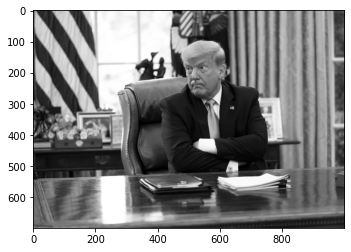

Image Tag : Donald Trump 
Image Similarity Rank : 39 
Similarity Score : 1.712522909478499 %








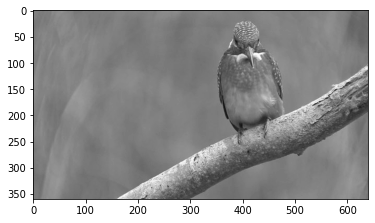

Image Tag : Kingfiher Front 
Image Similarity Rank : 40 
Similarity Score : 1.7115018520304797 %








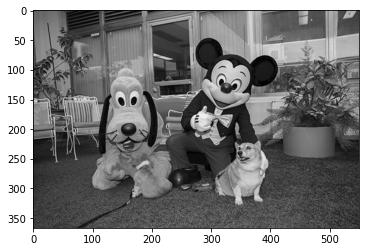

Image Tag : Pluto Mickey Mouse Pet 
Image Similarity Rank : 41 
Similarity Score : 1.7109920116817305 %








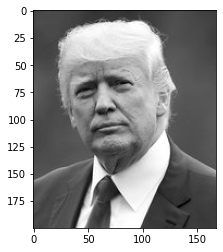

Image Tag : Donald Trump 
Image Similarity Rank : 42 
Similarity Score : 1.710228109691219 %








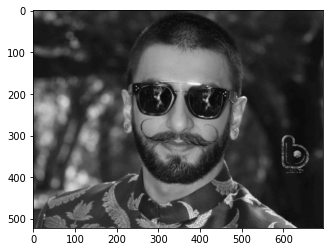

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 43 
Similarity Score : 1.709465235880793 %








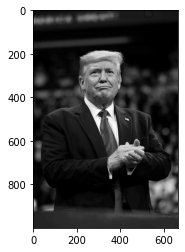

Image Tag : Donald Trump 
Image Similarity Rank : 44 
Similarity Score : 1.7013912886609874 %








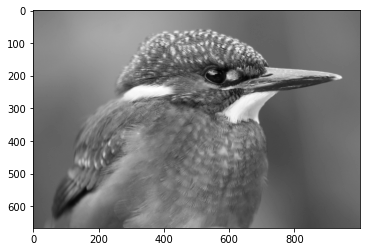

Image Tag : Kingfiher Front 
Image Similarity Rank : 45 
Similarity Score : 1.6954107723087444 %








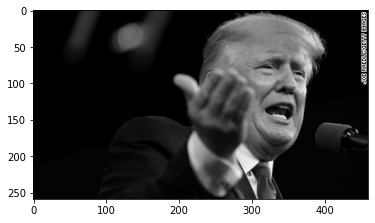

Image Tag : Donald Trump 
Image Similarity Rank : 46 
Similarity Score : 1.693678368281645 %








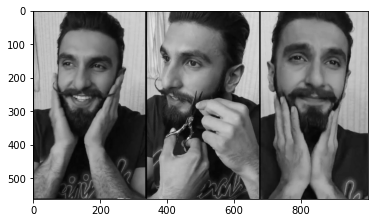

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 47 
Similarity Score : 1.69195129438032 %








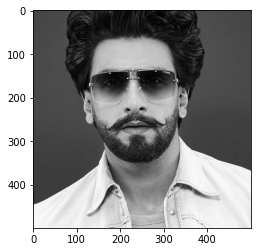

Image Tag : Ranveer Singh Moustache 
Image Similarity Rank : 48 
Similarity Score : 1.69195129438032 %








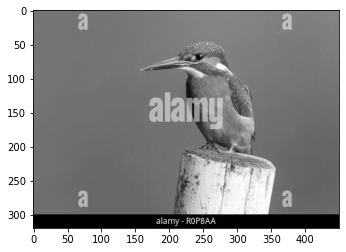

Image Tag : Kingfiher Front 
Image Similarity Rank : 49 
Similarity Score : 1.6907209183558143 %








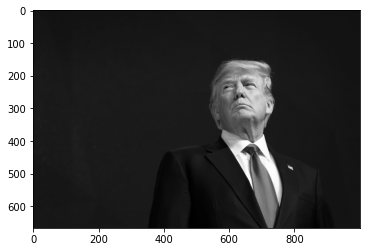

Image Tag : Donald Trump 
Image Similarity Rank : 50 
Similarity Score : 1.688757919460199 %








In [16]:
change_k(500)